<img src="https://github.com/hernancontigiani/ceia_memorias_especializacion/raw/master/Figures/logoFIUBA.jpg" width="500" align="center">


# Procesamiento de lenguaje natural




## Trabajo Práctico 2 - Custom embeddings con Gensim

### Alumna Noelia Qualindi
[Texto elegido: Orgullo y Prejuicio - Jane Austen](https://www.textos.info/jane-austen/orgullo-y-prejuicio)


1. Crear sus propios vectores con Gensim basado en lo visto en clase con otro dataset.
2. Probar términos de interés y explicar similitudes en el espacio de embeddings (sacar conclusiones entre palabras similitudes y diferencias).
3. Graficarlos.
4. Obtener conclusiones.

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import multiprocessing
from gensim.models import Word2Vec
import requests
import io

In [3]:
# URL del archivo en GitHub
url = "https://raw.githubusercontent.com/noequalindi/procesamiento_lenguaje_natural/trabajos_practicos_qualindi/trabajos_practicos/desafio_2/orgullo_prejuicio.txt"

response = requests.get(url)
text_data = response.text

with open("orgullo_prejuicio.txt", "w", encoding='utf-8') as file:
    file.write(text_data)

df = pd.read_csv('./orgullo_prejuicio.txt', sep='/n', header=None)
df.head()


/var/folders/ml/g_sxsst10mj890krz6gpp0980000gn/T/ipykernel_91278/3551006193.py:10: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  df = pd.read_csv('./orgullo_prejuicio.txt', sep='/n', header=None)


,0
0,Orgullo y Prejuicio
1,Jane Austen
2,textos.info
3,Biblioteca digital abierta
4,1


In [6]:
df.tail(20)

,0
10678,"tropezado. Ilustrada por Elizabeth, empezó a c..."
10679,puede tomarse con su marido unas libertades qu...
10680,puede tolerar a una hermana diez años menor qu...
10681,Lady Catherine se puso como una fiera con la b...
10682,abrió la esclusa a toda su genuina franqueza a...
10683,"que él le informaba de su compromiso, usó un l..."
10684,"especialmente al referirse a Elizabeth, que su..."
10685,"interrumpidas por algún tiempo. Pero, al final..."
10686,Darcy accedió a perdonar la ofensa y buscó la ...
10687,"resistió todavía un poquito, pero cedió o a su..."


In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
print("Cantidad de documentos:", df.shape[0])

Cantidad de documentos: 10698


In [8]:
from keras.preprocessing.text import text_to_word_sequence

sentence_tokens = []
for _, row in df[:None].iterrows():
    sentence_tokens.append(text_to_word_sequence(row[0]))


sentence_tokens[:2]

[['orgullo', 'y', 'prejuicio'], ['jane', 'austen']]

In [9]:
from gensim.models.callbacks import CallbackAny2Vec

class callback(CallbackAny2Vec):
    """
    Callback to print loss after each epoch
    """
    def __init__(self):
        self.epoch = 0

    def on_epoch_end(self, model):
        loss = model.get_latest_training_loss()
        if self.epoch == 0:
            print('Loss after epoch {}: {}'.format(self.epoch, loss))
        else:
            print('Loss after epoch {}: {}'.format(self.epoch, loss- self.loss_previous_step))
        self.epoch += 1
        self.loss_previous_step = loss

### Preprocesamiento

In [10]:
w2v_model = Word2Vec(min_count=10, window=5, vector_size=500, negative=20, workers=2, sg=0) # se usa CBOW

In [11]:
w2v_model.build_vocab(sentence_tokens)

In [12]:
# Cantidad de filas/docs encontradas en el corpus
print("Cantidad de docs en el corpus:", w2v_model.corpus_count)

Cantidad de docs en el corpus: 10698


In [13]:
# Cantidad de words encontradas en el corpus
print("Cantidad de words distintas en el corpus:", len(w2v_model.wv.index_to_key))

Cantidad de words distintas en el corpus: 1186


### Entrenamiento

In [14]:
# entrenamiento
w2v_model.train(sentence_tokens,
                 total_examples=w2v_model.corpus_count,
                 epochs=100,
                 compute_loss = True,
                 callbacks=[callback()])


Loss after epoch 0: 145910.765625
Loss after epoch 1: 129252.453125
Loss after epoch 2: 127584.375
Loss after epoch 3: 127237.65625
Loss after epoch 4: 128969.0
Loss after epoch 5: 126648.125
Loss after epoch 6: 123205.0
Loss after epoch 7: 121355.0625
Loss after epoch 8: 108096.4375
Loss after epoch 9: 106132.25
Loss after epoch 10: 104289.25
Loss after epoch 11: 103287.375
Loss after epoch 12: 102141.375
Loss after epoch 13: 101488.375
Loss after epoch 14: 99738.5
Loss after epoch 15: 98573.5
Loss after epoch 16: 97886.875
Loss after epoch 17: 97798.25
Loss after epoch 18: 91077.375
Loss after epoch 19: 87056.75
Loss after epoch 20: 86411.0
Loss after epoch 21: 85778.25
Loss after epoch 22: 85177.25
Loss after epoch 23: 83710.75
Loss after epoch 24: 84101.75
Loss after epoch 25: 77001.75
Loss after epoch 26: 82682.25
Loss after epoch 27: 82857.0
Loss after epoch 28: 75893.0
Loss after epoch 29: 75710.0
Loss after epoch 30: 88769.5
Loss after epoch 31: 88005.75
Loss after epoch 32: 73

(5928972, 11556500)

### Análisis de Similaridad de las palabras

In [15]:
w2v_model.wv.most_similar(positive=["darcy"], topn=15)

[('bingley', 0.5212520360946655),
 ('bennet', 0.4586159884929657),
 ('hurst', 0.38391077518463135),
 ('denny', 0.3371775150299072),
 ('wickham', 0.3103596568107605),
 ('bourgh', 0.3024161159992218),
 ('reynolds', 0.30194777250289917),
 ('gardiner', 0.2880125641822815),
 ('collins', 0.28643593192100525),
 ('caballero', 0.2700616419315338),
 ('inclinación', 0.2381124347448349),
 ('haciendo', 0.2354479879140854),
 ('elizabeth', 0.23321935534477234),
 ('sentido', 0.2268955260515213),
 ('amo', 0.22659701108932495)]

In [96]:
w2v_model.wv.most_similar(positive=["bennet"], topn=15)

[('hurst', 0.6432279944419861),
 ('reynolds', 0.5426551103591919),
 ('bennet—', 0.5425803661346436),
 ('gardiner', 0.5134212374687195),
 ('long', 0.486476331949234),
 ('philips', 0.47666117548942566),
 ('darcy', 0.47209227085113525),
 ('bingley', 0.45620641112327576),
 ('collins', 0.445467472076416),
 ('dicha', 0.2735520899295807),
 ('denny', 0.25850018858909607),
 ('inmediatamente', 0.25728586316108704),
 ('—me', 0.25603070855140686),
 ('forster', 0.24254237115383148),
 ('wickham', 0.23771236836910248)]

In [95]:
w2v_model.wv.most_similar(positive=["honor"], topn=15)

[('compasión', 0.32970523834228516),
 ('fuerza', 0.3057613968849182),
 ('respeto', 0.2937094569206238),
 ('bondad', 0.2883966267108917),
 ('nombre', 0.2736436128616333),
 ('proceder', 0.2726895809173584),
 ('dolor', 0.2682115435600281),
 ('placer', 0.25355544686317444),
 ('parentesco', 0.2502431273460388),
 ('esperanza', 0.24456971883773804),
 ('temía', 0.24346020817756653),
 ('afecto', 0.24340803921222687),
 ('carruaje', 0.24276140332221985),
 ('sobre', 0.23908567428588867),
 ('idea', 0.23874300718307495)]

In [94]:
w2v_model.wv.most_similar(positive=["orgullo"], topn=15)

[('fuerza', 0.3152526319026947),
 ('hijo', 0.3148351311683655),
 ('hombre', 0.3132009506225586),
 ('vanidad', 0.2887865900993347),
 ('dinero', 0.27340948581695557),
 ('principal', 0.27251726388931274),
 ('dulce', 0.27180078625679016),
 ('alto', 0.2628677487373352),
 ('gratitud', 0.2604857385158539),
 ('talento', 0.25806018710136414),
 ('sino', 0.24718019366264343),
 ('persona', 0.24499410390853882),
 ('secreto', 0.2431391179561615),
 ('modales', 0.24116092920303345),
 ('guapo', 0.2354183942079544)]

In [93]:
w2v_model.wv.most_similar(positive=["gratitud"], topn=15)

[('fuerza', 0.39706650376319885),
 ('rango', 0.3756750524044037),
 ('consideración', 0.34580370783805847),
 ('posición', 0.34054237604141235),
 ('propia', 0.33015331625938416),
 ('vanidad', 0.32583799958229065),
 ('respeto', 0.30798789858818054),
 ('belleza', 0.27536919713020325),
 ('dicha', 0.27470406889915466),
 ('institutriz', 0.2672082185745239),
 ('parte', 0.2653675675392151),
 ('orgullo', 0.2604857385158539),
 ('completo', 0.260152667760849),
 ('decisión', 0.2586403787136078),
 ('bondad', 0.24893762171268463)]

In [92]:
w2v_model.wv.most_similar(positive=["elizabeth"], topn=10)

[('ella', 0.32375502586364746),
 ('ventana', 0.2897384464740753),
 ('voz', 0.2789100706577301),
 ('georgiana', 0.2772451937198639),
 ('satisfecha', 0.2701931595802307),
 ('contestar', 0.26229923963546753),
 ('sonrisa', 0.2534905672073364),
 ('aquello', 0.24880827963352203),
 ('tono', 0.23625792562961578),
 ('levantó', 0.23130564391613007)]

In [87]:
w2v_model.wv.most_similar(positive=["felicidad"], topn=15)

[('consideración', 0.3797690272331238),
 ('conducta', 0.35529088973999023),
 ('confianza', 0.2888402044773102),
 ('opinión', 0.28371739387512207),
 ('cortesía', 0.28279104828834534),
 ('proposición', 0.2821531593799591),
 ('esperanza', 0.2820367217063904),
 ('razón', 0.2790669798851013),
 ('idea', 0.2771216332912445),
 ('parte', 0.2727758586406708),
 ('vergüenza', 0.26540109515190125),
 ('relación', 0.25974997878074646),
 ('desgracia', 0.25954335927963257),
 ('familia', 0.25119566917419434),
 ('amabilidad', 0.25065168738365173)]

In [88]:
w2v_model.wv.most_similar(positive=["interés"], topn=15)

[('sentimiento', 0.3296290338039398),
 ('afecto', 0.2819676101207733),
 ('sentía', 0.275715708732605),
 ('disgusto', 0.27471527457237244),
 ('plan', 0.2717750668525696),
 ('hijo', 0.27001166343688965),
 ('resultaba', 0.2698900103569031),
 ('agrado', 0.2692164480686188),
 ('hacia', 0.26406019926071167),
 ('inclinación', 0.25912049412727356),
 ('caso', 0.2510773241519928),
 ('éxito', 0.24974128603935242),
 ('términos', 0.24386999011039734),
 ('temía', 0.2364332228899002),
 ('estaba', 0.2351222187280655)]

In [89]:
w2v_model.wv.most_similar(positive=["proposición"], topn=15)

[('decisión', 0.40309035778045654),
 ('consideración', 0.3303096890449524),
 ('pregunta', 0.32476121187210083),
 ('carta', 0.30716246366500854),
 ('razón', 0.2901797294616699),
 ('visita', 0.28633108735084534),
 ('felicidad', 0.2821531593799591),
 ('pausa', 0.282021164894104),
 ('contestación', 0.28104162216186523),
 ('recuerdo', 0.2725495994091034),
 ('permítame', 0.26905396580696106),
 ('delicadeza', 0.26858171820640564),
 ('parte', 0.2612740397453308),
 ('esperanza', 0.2555364966392517),
 ('inútil', 0.25513511896133423)]

In [90]:
w2v_model.wv.most_similar(positive=["sentimiento"], topn=15)

[('asunto', 0.3944816589355469),
 ('interés', 0.3296290636062622),
 ('comportamiento', 0.3288255035877228),
 ('proceder', 0.3258492052555084),
 ('modo', 0.30705681443214417),
 ('viaje', 0.307056188583374),
 ('seguro', 0.30636781454086304),
 ('sentía', 0.29005372524261475),
 ('cumplido', 0.2895459532737732),
 ('caballero', 0.28712016344070435),
 ('inclinación', 0.28621038794517517),
 ('afecto', 0.2855508625507355),
 ('motivo', 0.28375160694122314),
 ('hombre', 0.2802550196647644),
 ('carruaje', 0.279574990272522)]

In [65]:
vector_orgullo = w2v_model.wv.get_vector("orgullo")
print(vector_orgullo)


[-1.16235219e-01 -3.25619906e-01 -4.51158822e-01 -6.61573827e-01
  1.12584077e-01 -3.08826417e-01 -3.63425136e-01 -1.18561780e+00
 -1.77525535e-01  3.72551620e-01  3.94955277e-02 -4.14173782e-01
 -6.98888958e-01  3.54374707e-01 -6.30558193e-01 -4.74394828e-01
  4.10057187e-01 -3.21811587e-01  1.90646127e-01 -5.89590549e-01
  6.07752334e-03 -2.40983471e-01 -7.29974508e-01  8.54611695e-01
 -7.77029991e-01  1.00352478e+00 -1.50173783e-01 -8.77271414e-01
 -1.52384862e-01 -5.61953664e-01  4.20040160e-01  2.32869536e-01
  1.37345403e-01  1.05058007e-01 -2.20594388e-02  1.97603539e-01
 -4.22476411e-01  2.67409533e-01  5.11090875e-01 -4.67622161e-01
 -1.23797193e-01  4.64684725e-01  2.46661436e-02  1.08892903e-01
  4.59861271e-02  1.00209765e-01  3.32179964e-01  4.34345573e-01
  6.54431760e-01 -3.20658535e-01  1.40446901e+00  3.20521712e-01
  8.58685553e-01  9.08327997e-01 -9.72073555e-01  5.30952394e-01
  5.52778661e-01 -6.56527698e-01 -5.31426728e-01  4.09220517e-01
 -4.43599284e-01 -6.73399

In [66]:
w2v_model.wv.most_similar(vector_orgullo)

[('orgullo', 0.9999999403953552),
 ('fuerza', 0.3152526021003723),
 ('hijo', 0.31483516097068787),
 ('hombre', 0.3132009506225586),
 ('vanidad', 0.2887865900993347),
 ('dinero', 0.27340948581695557),
 ('principal', 0.27251726388931274),
 ('dulce', 0.27180078625679016),
 ('alto', 0.2628677189350128),
 ('gratitud', 0.2604857385158539)]

In [81]:
vector_darcy = w2v_model.wv.get_vector("darcy")
print(vector_darcy)

[ 2.13024929e-01 -1.22156966e+00  5.48098795e-02 -6.62853837e-01
  8.43318760e-01  2.90061295e-01  7.05205649e-03 -1.61405411e-02
 -4.41514254e-02 -2.64447242e-01  4.60332185e-01 -4.02235776e-01
 -2.28713274e-01 -1.27765071e+00 -4.51827973e-01  1.26358140e+00
  6.33308947e-01 -1.05353570e+00  8.41284156e-01 -8.18857074e-01
 -7.61309087e-01 -2.48664543e-02 -8.41997683e-01  6.33547127e-01
 -1.51310158e+00  3.53554219e-01 -8.26261118e-02 -3.81268822e-02
  1.22765863e+00 -4.30307180e-01 -3.79149824e-01 -1.46599963e-01
  4.30306107e-01  8.27683449e-01 -4.75695342e-01  6.57664895e-01
  4.14406002e-01 -1.05331883e-01 -1.13921213e+00 -5.85194826e-01
  5.07825240e-03 -1.75250217e-01 -9.00542974e-01 -6.95965409e-01
 -3.16496730e-01  1.06867284e-01 -5.66332936e-01  2.50550628e-01
 -7.05890805e-02 -4.83598560e-01 -7.25794137e-01  2.44809642e-01
  6.30556270e-02 -2.76003014e-02 -1.00407135e+00 -2.81925321e-01
 -1.24468839e+00  2.86607146e-01  1.53325289e-01  3.01371634e-01
  7.04933107e-01  4.32078

In [82]:
w2v_model.wv.most_similar(vector_darcy)

[('darcy', 1.0000001192092896),
 ('bingley', 0.5175530910491943),
 ('bennet', 0.47209227085113525),
 ('hurst', 0.3707272708415985),
 ('denny', 0.34556323289871216),
 ('wickham', 0.329140305519104),
 ('caballero', 0.30188125371932983),
 ('gardiner', 0.29805004596710205),
 ('reynolds', 0.29780131578445435),
 ('collins', 0.28011345863342285)]

### Conclusiones sobre la similaridad y diferencias

**Darcy:**

Las palabras más similares a "darcy" incluyen personajes como "bingley", "bennet", "hurst", "wickham", y otros. Esto refleja la proximidad de estos personajes a Darcy en la narrativa de la novela. Palabras como "caballero", "haciendo", y "inclinación" sugieren contextos en los que Darcy aparece, reforzando su carácter y acciones.

**Bennet:**

Las palabras más cercanas a "bennet" también incluyen personajes como "hurst", "reynolds", "bennet—", "gardiner", y otros. La presencia de "darcy" y "bingley" en esta lista indica la interacción frecuente entre estos personajes. Palabras como "dicha" y "inmediatamente" reflejan situaciones y emociones asociadas con la familia  Bennet, la familia de Elizabeth.

**Honor:**

Las palabras relacionadas con "honor" incluyen conceptos como "compasión", "fuerza", "respeto", y "bondad". Esto muestra que el honor está asociado con virtudes y emociones positivas en el texto.

**Orgullo:**

Las palabras cercanas a "orgullo" como "fuerza", "hijo", "hombre", y "vanidad" destacan la relación del orgullo con características personales y emociones. La palabra "vanidad" sugiere una conexión directa entre el orgullo y la percepción de sí mismo.

**Gratitud:**

La gratitud está relacionada con "fuerza", "rango", "consideración", y "posición", sugiriendo que la gratitud está vinculada a la percepción social y el estatus.

**Elizabeth:**

Las palabras más similares a "elizabeth" incluyen "ella", "ventana", "voz", y "georgiana", mostrando que Elizabeth es un personaje central que interactúa con muchos otros en diferentes contextos.

**Felicidad:**

Las palabras relacionadas con "felicidad" como "consideración", "conducta", "confianza", y "opinión" indican que la felicidad está asociada con la percepción social y las relaciones personales.
Interés:

El interés está vinculado con "sentimiento", "afecto", "sentía", y "disgusto", reflejando una variedad de emociones y contextos en los que se menciona.

**Proposición:**

Las palabras cercanas a "proposición" incluyen "decisión", "consideración", "pregunta", y "carta", lo que sugiere que las proposiciones están vinculadas a decisiones y comunicaciones importantes. Siempre este tema rondaba en los personajes principales (Darcy y Elizabeth)

**Sentimiento:**

Las palabras relacionadas con "sentimiento" como "asunto", "interés", "comportamiento", y "proceder" indican que los sentimientos están interrelacionados con acciones y situaciones.


In [16]:
from sklearn.decomposition import IncrementalPCA
from sklearn.manifold import TSNE
import numpy as np

def reduce_dimensions(model, num_dimensions = 2 ):

    vectors = np.asarray(model.wv.vectors)
    labels = np.asarray(model.wv.index_to_key)

    tsne = TSNE(n_components=num_dimensions, random_state=0)
    vectors = tsne.fit_transform(vectors)

    return vectors, labels

In [17]:
# Graficar los embedddings en 2D
import plotly.graph_objects as go
import plotly.express as px

vecs, labels = reduce_dimensions(w2v_model)

MAX_WORDS=200
fig = px.scatter(x=vecs[:MAX_WORDS,0], y=vecs[:MAX_WORDS,1], text=labels[:MAX_WORDS])
fig.show(renderer="colab")

In [74]:
# Graficar los embedddings en 3D

vecs, labels = reduce_dimensions(w2v_model,3)

fig = px.scatter_3d(x=vecs[:MAX_WORDS,0], y=vecs[:MAX_WORDS,1], z=vecs[:MAX_WORDS,2],text=labels[:MAX_WORDS])
fig.update_traces(marker_size = 2)
fig.show(renderer="colab")

In [78]:
# http://projector.tensorflow.org/

vectors = np.asarray(w2v_model.wv.vectors)
labels = list(w2v_model.wv.index_to_key)

np.savetxt("vectors.tsv", vectors, delimiter="\t")

with open("labels.tsv", "w") as fp:
    for item in labels:
        fp.write("%s\n" % item)

In [80]:
import numpy as np
import tensorflow as tf
from tensorboard.plugins import projector
import gensim
import os

# vectores y las etiquetas
vectors = np.asarray(w2v_model.wv.vectors)
labels = list(w2v_model.wv.index_to_key)

# Guardar vectores y etiquetas en archivos TSV para TensorFlow Projector
np.savetxt("vectors.tsv", vectors, delimiter="\t")

with open("labels.tsv", "w") as fp:
    for item in labels:
        fp.write("%s\n" % item)

# directorio log para TensorBoard
log_dir = "logs/word2vec_projector"
if not os.path.exists(log_dir):
    os.makedirs(log_dir)

# Guardar los vectores en un archivo de embeddings para TensorBoard
with open(os.path.join(log_dir, 'meta.tsv'), 'w') as f:
    for label in labels:
        f.write(f"{label}\n")

# Crear un archivo de configuración para el proyecto de embeddings
config = projector.ProjectorConfig()
embedding = config.embeddings.add()
embedding.tensor_name = 'word2vec_embeddings'
embedding.metadata_path = os.path.join(log_dir, 'vectors.tsv')

# Guardar los vectores en un archivo para TensorBoard
weights = tf.Variable(vectors, name='word2vec_embeddings')
checkpoint = tf.train.Checkpoint(embedding=weights)
checkpoint.save(os.path.join(log_dir, 'embedding.ckpt'))

# Guardar el archivo de configuración
projector.visualize_embeddings(log_dir, config)

# Iniciar TensorBoard
%load_ext tensorboard
%tensorboard --logdir {log_dir}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 8417), started 0:02:00 ago. (Use '!kill 8417' to kill it.)

<IPython.core.display.Javascript object>

### Utilizando tokenización y stopwords

In [21]:
import pandas as pd
from gensim.models import Word2Vec
from keras.preprocessing.text import text_to_word_sequence
from nltk.corpus import stopwords
import nltk

nltk.download('stopwords')
spanish_stopwords = set(stopwords.words('spanish'))

# filtra stopwords y tokeniza
sentence_tokens = []
for _, row in df.iterrows():
    tokens = text_to_word_sequence(row[0])
    filtered_tokens = [token for token in tokens if token not in spanish_stopwords]
    sentence_tokens.append(filtered_tokens)

# se entrena el modelo de nuevo
w2v_model = Word2Vec(min_count=10, window=5, vector_size=500, negative=20, workers=2, sg=0)
w2v_model.build_vocab(sentence_tokens)
w2v_model.train(sentence_tokens, total_examples=w2v_model.corpus_count, epochs=100)



[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


(3151045, 5718500)

In [22]:
# Lista de palabras de interés
words_of_interest = ["darcy", "bennet", "honor", "orgullo", "gratitud", "elizabeth", "felicidad", "interés", "proposición", "sentimiento"]

# diccionario para almacenar palabras similares
similar_words = {}

for word in words_of_interest:
    similar_words[word] = [w for w, _ in w2v_model.wv.most_similar(positive=[word], topn=15)]

print(similar_words)


{'darcy': ['bingley', 'bennet', 'hurst', 'luego', 'curiosidad', 'elizabeth', 'dueño', 'reynolds', 'contó', 'sonrisa', 'rápidamente', 'casi', 'contestó', 'wickham', 'indiferencia'], 'bennet': ['hurst', 'bennet—', 'long', 'philips', 'collins', 'reynolds', 'gardiner', 'bingley', 'darcy', 'kitty', 'trató', 'inmediatamente', 'martes', 'casada', 'excelente'], 'honor': ['menor', 'gracias', 'respuesta', 'vanidad', 'conozco', 'razón', 'recibir', 'todas', 'temía', 'hacerlo', 'olvidar', 'casamiento', 'familia', 'nombre', 'aquellas'], 'orgullo': ['fuerza', 'vanidad', 'amistad', 'talento', 'dinero', 'única', 'unas', 'rango', 'hijo', 'creído', 'aunque', 'sintió', 'gratitud', 'razonable', 'decisión'], 'gratitud': ['respeto', 'verdadero', 'fuerza', 'confieso', 'esperaba', 'vanidad', 'casos', 'deber', 'creía', 'conocer', 'verle', 'proposición', 'hacerlo', 'naturaleza', 'alto'], 'elizabeth': ['ventana', 'seguida', 'sábado', 'aquello', 'jane', 'rápidamente', 'miró', 'pausa', 'entusiasmo', 'contestar', 'a

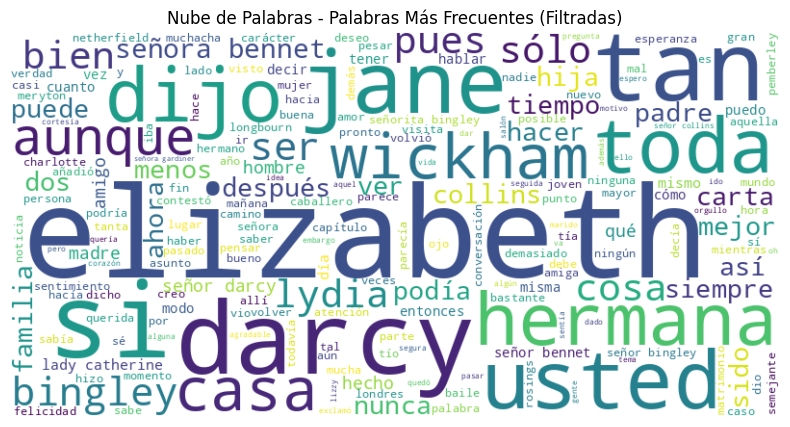

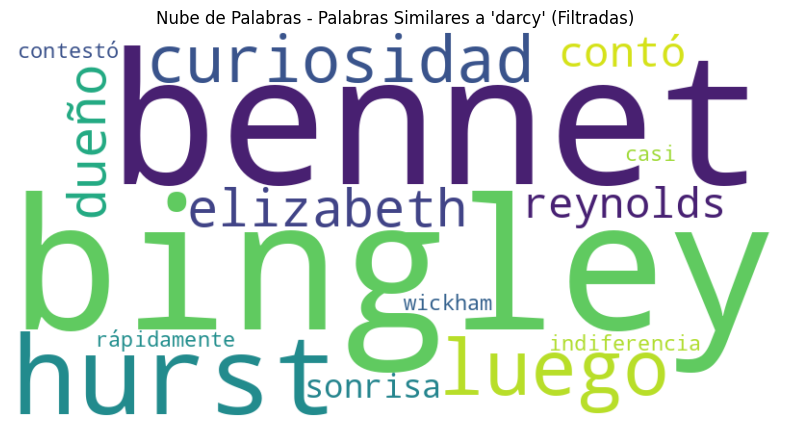

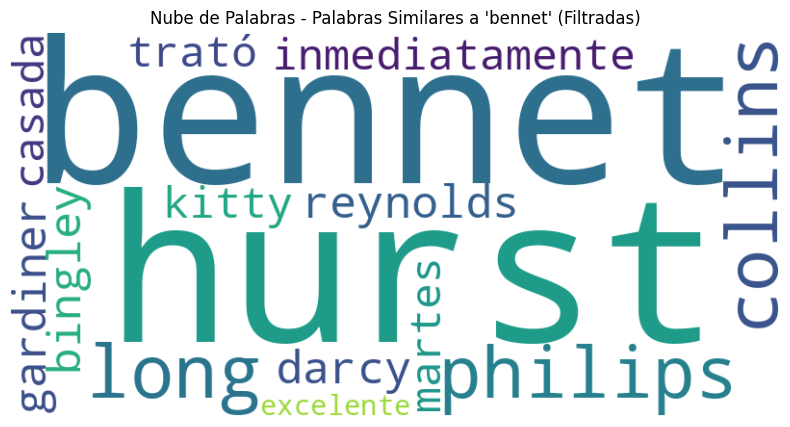

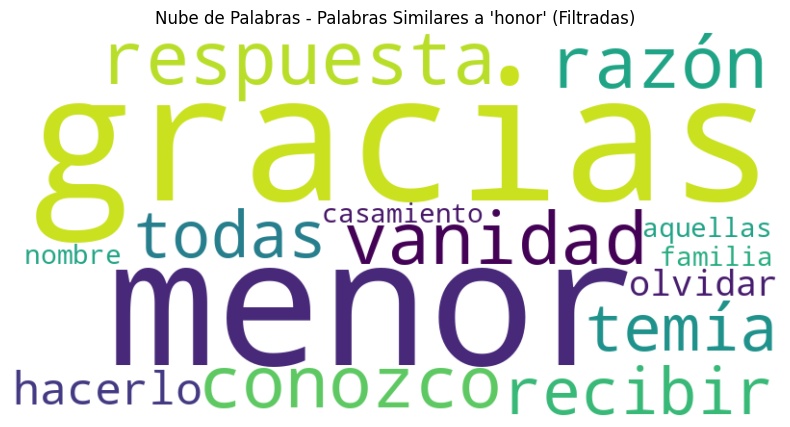

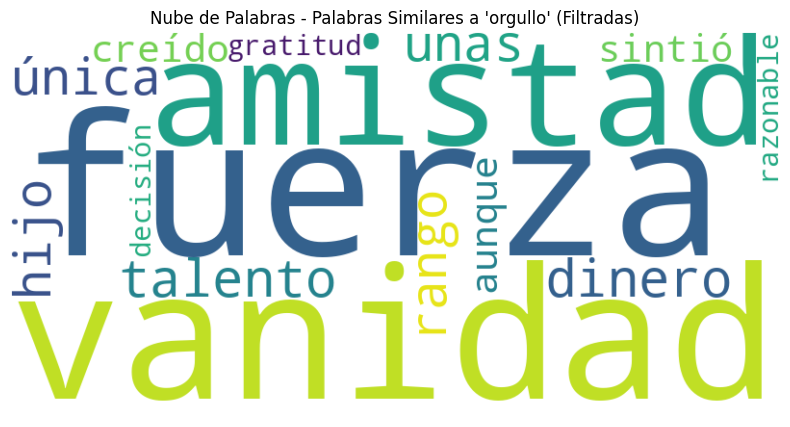

...

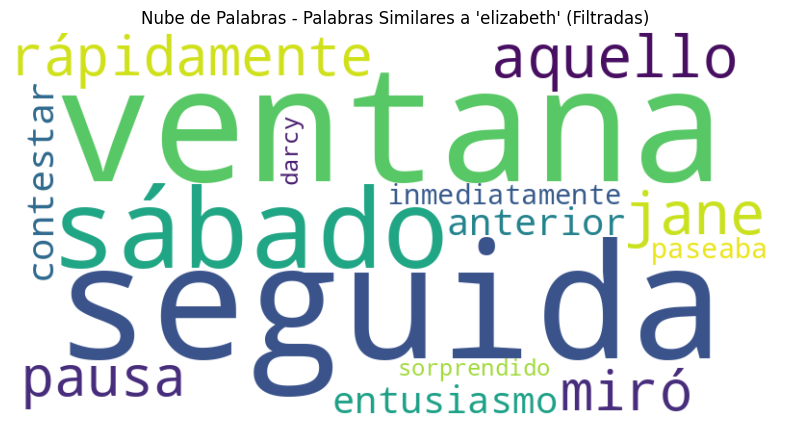

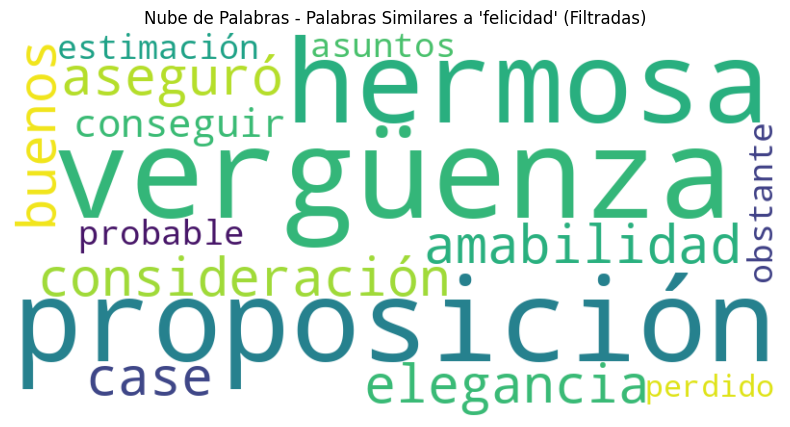

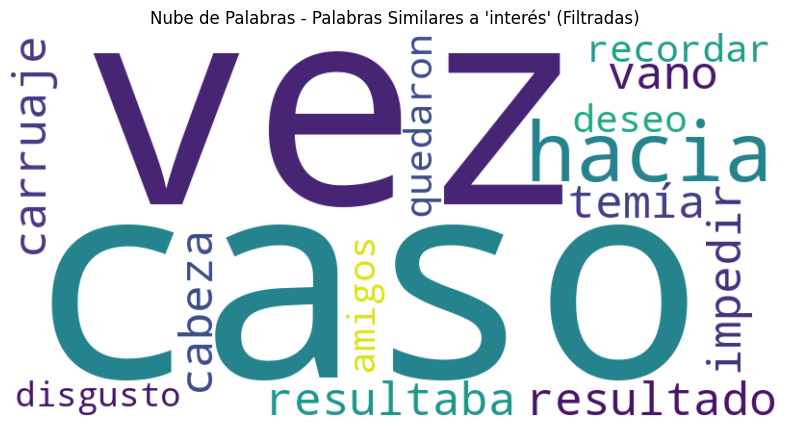

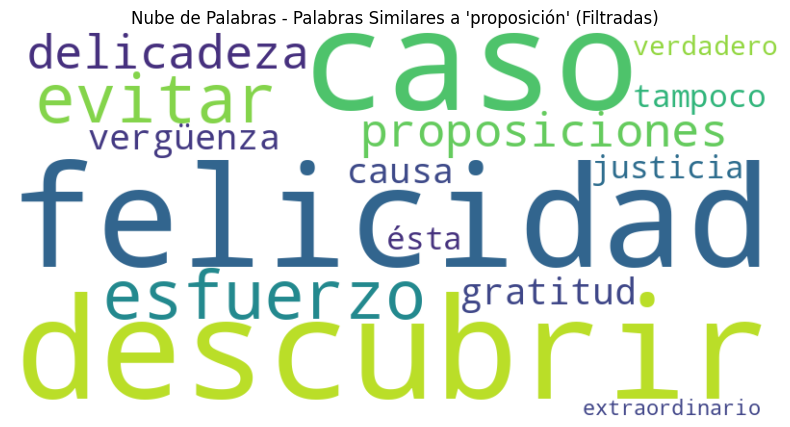

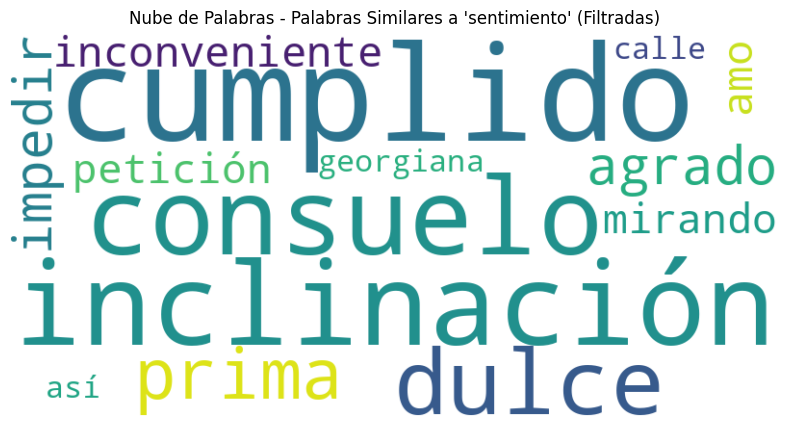

In [23]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Nube de palabras para las palabras más frecuentes en el dataframe
text = " ".join([" ".join(tokens) for tokens in sentence_tokens])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Nube de Palabras - Palabras Más Frecuentes (Filtradas)")
plt.show()

# Nube de palabras para las palabras similares a las palabras de interés
for word, similar in similar_words.items():
    similar_text = " ".join(similar)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(similar_text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Nube de Palabras - Palabras Similares a '{word}' (Filtradas)")
    plt.show()


 ### Conclusión
Luego de haber probado varios métodos y configuraciones, se utilizó el algoritmo Continuous Bag of Words (CBOW) y el resto de los parámetros elegidos del modelo, lo cuál resultaron en una mejor similitud de palabras en el contexto del texto analizado.

Al observar las palabras más similares a los términos clave de la novela "Orgullo y Prejuicio" de Jane Austen (en español), se puede concluir que se muestran características de los personajes y relaciones entre ellos. En algunos casos también muestra cómo las emociones y sentimientos influyen en las acciones y decisiones de los personajes.

La visualización de una nube de palabras basada en las palabras más repetidas y las palabras analizadas con sus cercanías, da una representación visual sobre su relevancia en el texto. Esto ayuda a identificar visualmente los temas y personajes más importantes en la narrativa.

 Finalmente, con el proceso de stopwords, se eliminaron palabras comunes que no aportan significado al texto, por lo que mejoró la calidad del análisis de similitud de palabras y las nubes de palabras. Las configuraciones utilizadas para entrenar el modelo Word2Vec mejoraron significativamente la similitud de palabras, permitiendo una comprensión más profunda de las relaciones entre los personajes y los temas planteados en la novela.